In [ ]:
# Initialize Otter
import otter
grader = otter.Notebook("csc475-575-Spring2022-assignment6.ipynb")

# CSC475/575 Spring 2022 - Assignment 

This assignment covers topics related to sound source separation and transcription. Information about the course can be found at the 
[CSC475/575 Brightspace](https://bright.uvic.ca/d2l/home/196001). 


* A6.1: Listening to results of sound source separation using Spleeter 
* A6.2: Pitch shift vocals and remix    
* A6.3: Sonify pitch of vocals 
* A6.4: Create simple drum track from drum stem 
* A6.5: Simple music transcription of melody 

CSC575 only (instead of A4.1): 
* A6.G: Experimental investigation of the use of sound source separation for genre classification  

Each question is worth 2 points for a total of 10 points for the assignment. 


In [6]:
import numpy as np
import random
import IPython.display as ipd
import matplotlib.pyplot as plt
import math 
import librosa
import librosa.display
%matplotlib inline
#import otter
#grader = otter.Notebook()


#### **Question A6.1 (basic):** 
 
 
In this question you will be using a state-of-the art deep learning sound source separation library: https://github.com/deezer/spleeter to explore sound source separation, and transcription. 
Use the recording: `pop.00015.wav` for the questions in this assignment. 
 
Run the sound source separation with the 4 stem model on this example audio track. Listen and plot the time-domain waveforms of the 4 individual stems. Comment on what you hear.

 (**Basic: 2 points**)


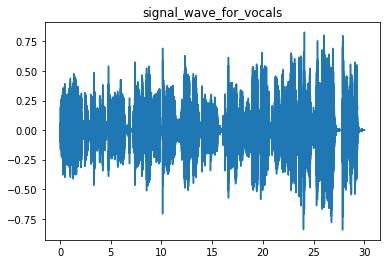

In [10]:
#I have used command prompt to separate 4 stems, spleeter separate -i rock.wav -p spleeter:4stems -o output
audio,srate = librosa.load("pop.00015.wav")
audio,sr = librosa.load("vocals.wav")
vocal = librosa.stft(audio)
vocal = librosa.istft(vocal)
time = np.linspace(0,len(vocal)/srate,num = len(vocal))
plt.figure(1)
plt.title("signal_wave_for_vocals")
plt.plot(time,vocal)
ipd.Audio(audio,rate = sr)

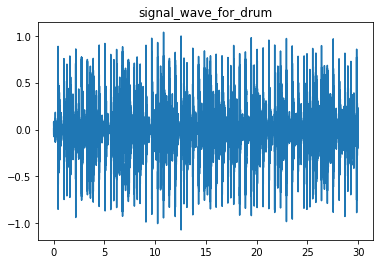

In [11]:
audio,srate = librosa.load("drums.wav")
vocal = librosa.stft(audio)
drum = librosa.istft(vocal)
time = np.linspace(0,len(drum)/srate,num = len(drum))
plt.figure(1)
plt.title("signal_wave_for_drum")
plt.plot(time,drum)

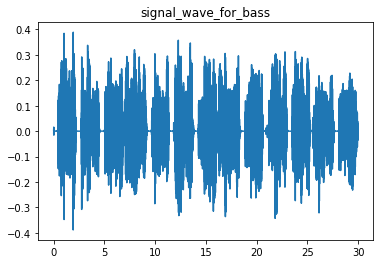

In [12]:
audio,srate = librosa.load("bass.wav")
vocal = librosa.stft(audio)
bass = librosa.istft(vocal)
time = np.linspace(0,len(bass)/srate,num = len(bass))
plt.figure(1)
plt.title("signal_wave_for_bass")
plt.plot(time,bass)

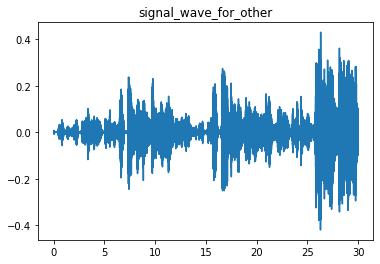

In [13]:
audio,srate = librosa.load("other.wav")
vocal = librosa.stft(audio)
other = librosa.istft(vocal)
time = np.linspace(0,len(other)/srate,num = len(other))
plt.figure(1)
plt.title("signal_wave_for_other")
plt.plot(time,other)

#### **Question A6.2 (basic):** 

Pitch shift the vocal stem by a major third (4 semitones) using [librosa.effects.pitch_shift](https://librosa.org/doc/latest/generated/librosa.effects.pitch_shift.html) and mix the pitch shifted audio with the other stems. Listen to the result and comment on it. 


(**Basic: 2 points**)


In [14]:
vocal,srate= librosa.load("vocals.wav")
drum,srate = librosa.load("drums.wav")
bass,srate = librosa.load("bass.wav")
other,srate = librosa.load("other.wav")
y_third = librosa.effects.pitch_shift(vocal,srate, n_steps=4)
mix_audio = np.vstack([y_third,drum,bass,other])
ipd.Audio(mix_audio,rate = srate)

<ipython-input-14-5cee30ca1af4>:5: FutureWarning: Pass sr=22050 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  y_third = librosa.effects.pitch_shift(vocal,srate, n_steps=4)


**Question A6.3 (expected):** 

Run monophonic pitch detection using the [probabilistic yin algorithm](https://librosa.org/doc/main/generated/librosa.pyin.html#librosa.pyin) on the vocal stem, sonify it using a sinusoid (you can use the sonification code provided below) and mix with the drum track. Listen to the result and comment on whether you still recognize the song.

**(2 points)** 


In [17]:
# Function to sonify a pitch track into a sine wave
def sonify(pitch_track, srate, hop_size):

    times = np.arange(0.0, float(hop_size * len(pitch_track)) / srate,
                      float(hop_size) / srate)

    # sample locations in time (seconds)                                                      
    sample_times = np.linspace(0, np.max(times), int(np.max(times)*srate-1))

    # create linear interpolators for frequencies and amplitudes                              
    # so that we have a frequency and amplitude value for 
    # every sample 
    freq_interpolator = interp1d(times,pitch_track)

    # use the interpolators to calculate per sample frequency and                             
    # ampitude values                                                                         
    sample_freqs = freq_interpolator(sample_times)

    # create audio signal                                                                     
    audio = np.zeros(len(sample_times));
    T = 1.0 / srate
    phase = 0.0
    
    # update phase according to the sample frequencies 
    for i in range(1, len(audio)):
        audio[i] =  np.sin(phase)
        phase = phase + (2*np.pi*T*sample_freqs[i])

    return audio

In [19]:
def pitch_fft(frame, srate): 
    mag = np.abs(np.fft.fft(frame))
    mag = mag[0:int(len(mag)/2)]
    pitch_estimate = np.argmax(mag) * (srate / len(frame))
    return pitch_estimate
def pitch_track(signal, hopSize, winSize, extractor): 
    offsets = np.arange(0, len(signal), hopSize)
    pitch_track = np.zeros(len(offsets))
    amp_track = np.zeros(len(offsets))
    
    for (m,o) in enumerate(offsets): 
        frame = signal[o:o+winSize] 
        pitch_track[m] = extractor(frame, srate)
        amp_track[m] = np.sqrt(np.mean(np.square(frame)))  

        if (pitch_track[m] > 1500): 
            pitch_track[m] = 0 
        
    return (amp_track, pitch_track)

from scipy.interpolate import interp1d 
vocal,srate= librosa.load('vocals.wav')
at1, pt1= pitch_track(vocal,256,512,pitch_fft)
pt1_audio = sonify(pt1, srate, 256)
mix1 = np.vstack([drum[0:len(pt1_audio)],pt1_audio])
ipd.Audio(mix1,rate = srate)

<!-- BEGIN QUESTION -->

#### **Question A6.4 (expected):** 

Inspect the magnitude spectrogram of the drum track and try to identify features that characterize the kick sound and the snare sound. Based on your visual inspection write a simple kick and snare detection method that outputs the times where a kick or snare drum occurs. Your method only needs to work for the specific example you are examining and does not need to be perfect. Create a new track by placing the kick.wav and snare.wav samples from the resources folder in the detected locations. Mix your synthetic toy drum track and sinusoid sonification from the previous question and listen to the result. Can you still identify the song?


In [20]:
print("The length of the drum track is",len(drum))


The length of the drum track is 661504


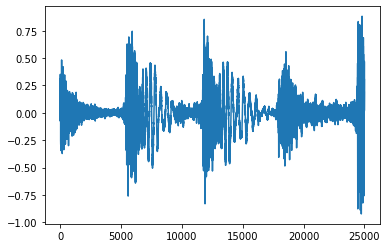

In [21]:
plt.plot(drum[125000:150000])

In [22]:
ipd.Audio(drum[125000:150000],rate = srate)

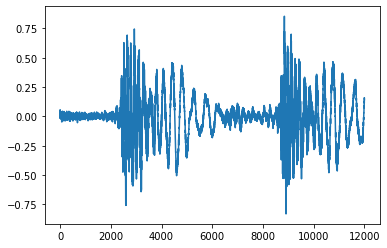

In [23]:
plt.plot(drum[128000:140000])

We can generate that the peak amplitude for snare is above 0.6,while kick drum's peak is over 0.3

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

**Question A6.5 (advanced):** 

Run beat tracking on the drum track (result from spleeter) and then use the resulting beat onsets combined with the extracted pitch from the vocal melody to transcribe the vocal melody to music notation using [music21](https://web.mit.edu/music21/). For each beat map the median MIDI pitch of the vocals to a tiny notation string. Listen to the generated MIDI melody using Music21. Can you still identify the melody?



 

**(2 points)**


Text(0.5, 1.0, 'Figure for snare drum')

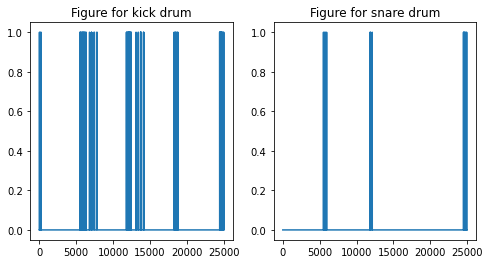

In [24]:
def drum_detection(audio):
    snare = []
    kick = []
    for i in range(len(audio)):
        if audio[i] > 0.6:
            snare.append(i)
        elif audio[i] > 0.35:
            kick.append(i)
    return kick, snare

kick,snare = drum_detection(drum)

k = np.zeros(len(drum))
for i in kick:
    k[i] = 1
s = np.zeros(len(drum))
for i in snare:
    s[i] = 1

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.plot(k[125000:150000])
plt.title('Figure for kick drum')
plt.subplot(1, 2, 2)
plt.plot(s[125000:150000])
plt.title('Figure for snare drum')

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

#### **Question A6.G (CSC575/advanced):** 

This question only needs to be answered by graduate students who are registered in CSC575 and for these students it will be graded instead of question A6.1 which is optional for them. 

Use the feature extraction code from: [kadenze_mir_c2_s1_2_classification.ipynb](https://github.com/gtzan/mir_program_kadenze/blob/master/course2/session1/kadenze_mir_c2_s1_2_classification.ipynb) to compute track-level audio features for all the GTZAN dataset and 
train a linear support vector machine for classification with 5-fold cross-validation.  

Use the 2-stem model of Spleeter to separate vocals and accompaniment for all 1000 tracks of the GTZAN dataset. 
Now compute the classification results using the same audio features, classifier, and cross-validation for the following configurations: 

1. Original 
2. Vocals-only 
3. Accompanuiment-only 
4. Vocals audio features concatenated with accompaniment audio features 

Show the results in a table. 

The comparison with configuration 4 is somewhat unfair as the dimensionality of the feature vector is double the dimensionality of the other configruations. Using principal component analysis (PCA) from sklearn to 
reduce the dimensions of each of these configurations to 10. Repeat the classification experiment for the PCA-transformed configurations. 

Show the PCA-transformed results in a table and write a paragraph about what conclusions you can draw from this small experiment. 


<!-- END QUESTION -->



---

To double-check your work, the cell below will rerun all of the autograder tests.

In [ ]:
grader.check_all()

## Submission

Make sure you have run all cells in your notebook in order before running the cell below, so that all images/graphs appear in the output. The cell below will generate a zip file for you to submit. **Please save before exporting!**

In [ ]:
# Save your notebook first, then run this cell to export your submission.
grader.export()